In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import pandas as pd
import healpy as hp
from scipy.stats import binned_statistic
import rubin_sim.maf as maf
from rubin_sim.data import get_baseline
import time
import sys
import sqlite3
import json
import glob
from natsort import natsorted

import imageio
from IPython.display import Image

In [2]:
# data_path = "/Users/jrobinson/rubin_templates/remove_no_template_results_32_noDD"
# savefig_path = "plot_template_coverage_figs"
# metric_fname = "first_year_baseline_v3_0_10yrs_tscale-28_nside-32_doAllTemplateMetrics_Count_r_and_night_lt_*_and_note_not_like_DD_HEAL.npz"

In [3]:
# baseline = "first_year_baseline_v3_3_10yrs_db_noDD_noTwi"
# # filt = "_r_and"
# filt = ""
# nside = 256
# tscale = 3
# data_path = "/home/jrobinson/rubin_templates/remove_no_template_results_{}_{}".format(nside,baseline)
# metric_fname = "{}_tscale-{}_nside-{}_doAllTemplateMetrics_reduceCount{}_night_lt_*_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz".format(
#                     baseline.split("_db_noDD_noTwi")[0],tscale,nside,filt)
# savefig_path = "plot_template_coverage_figs"

# metric_fname

In [4]:
# baseline = "first_year_baseline_v3_3_10yrs_db_noDD_noTwi"
# runName = "first_year_baseline_v3_3_10yrs_db_noDD_noTwi"
baseline = "first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi"
runName = "first_year_baseline_v3_3_10yrs_db_noDD_noTwi"
night_min = 0
night_max = 365
# keep_nights = [3,90,180,270,365]
keep_nights = [7,91,182,273,364]
# keep_nights = np.arange(night_min,night_max+1,1)

filt = "_r_and"
# filt = ""
# nside = 32
nside = 256
# tscale = 28
# nside = 256
# tscale = 3
tscale = 7
metric = "doAllTemplateMetrics_reduceCount"
# metric = "CountMetric"

savedir = "{}_nside_{}_t-{}d_{}".format(baseline,nside,tscale,metric)

data_path = "/home/jrobinson/rubin_templates/remove_no_template_results_{}_{}".format(nside,baseline)

# metric_fname = "{}_tscale-{}_nside-{}_{}{}_night_lt_*_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz".format(
#                     baseline.split("_db_noDD_noTwi")[0],tscale,nside,metric,filt)
metric_fname = "{}_tscale-{}_nside-{}_{}{}_night_lt_*_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz".format(
                    runName,tscale,nside,metric,filt)

savefig_path = "plot_template_coverage_figs/{}".format(savedir)

if not os.path.isdir(savefig_path):
    print("mkdir {}".format(savefig_path))
    os.mkdir(savefig_path)


mkdir plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount


In [5]:
metric_fname

'first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_*_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz'

In [6]:
data_path

'/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi'

In [7]:
"{}/{}".format(data_path,metric_fname)

'/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_*_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz'

In [8]:
metric_files = glob.glob("{}/{}".format(data_path,metric_fname))
metric_files = natsorted(metric_files)

In [9]:
metric_files

['/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_14_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_21_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_n

In [10]:
metric_files_keep = [x for x in metric_files if int(x.split("_lt_")[-1].split("_")[0]) in keep_nights]

In [11]:
metric_files_keep

['/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_91_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_182_and_note_not_like_DD_and_note_not_like_twilight_HEAL.npz',
 '/home/jrobinson/rubin_templates/remove_no_template_results_256_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_

In [12]:
if len(metric_files_keep)<len(metric_files):
    savedir = "keep_nights_" + savedir
    
print(savedir)

keep_nights_first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount


In [13]:
mb = maf.MetricBundle.load(metric_files[0])

Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes


In [14]:
mb.__dict__

{'metric': <rubin_sim.maf.metrics.base_metric.BaseMetric at 0x7f9ce4277a30>,
 'slicer': <rubin_sim.maf.slicers.healpix_slicer.HealpixSlicer at 0x7f9ca33142e0>,
 'constraint': 'filter = "r" and night <= 7 and note not like "%DD%" and note not like "%twilight%"',
 'stacker_list': [],
 'maps_list': None,
 'summary_metrics': [],
 'info_label': 'r and night < 7 and note not like %DD% and note not like %twilight%',
 'run_name': 'first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256',
 'file_root': 'first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL',
 'db_cols': None,
 'plot_funcs': [<rubin_sim.maf.plots.spatial_plotters.HealpixSkyMap at 0x7f9ce4277e20>,
 'plot_dict': {},
 'display_dict': {'group': None,
  'subgroup': None,
  'order': 2,
  'caption': 'doAllTemplateMetrics calculated on a HealpixSlicer basis using a subset of data selected via filter = "r" and night <=

In [15]:
mb.file_root

'first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL'

In [16]:
# retrieve data/mask for all the masked arrays
# each value in data corresponds to the metric value for some slice point
data = mb.metric_values.data
mask = mb.metric_values.mask
metric_vals = np.ma.array(data, mask=mask)
        
# replace the masked values with nan
metric_vals.fill_value = np.nan

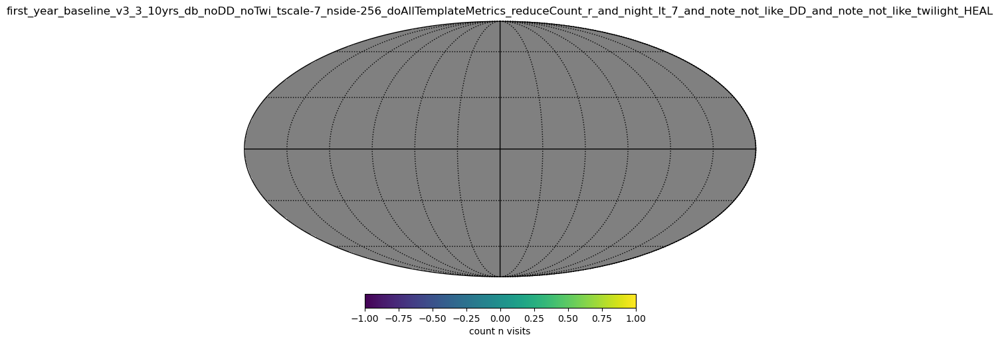

In [17]:
#plot the skymap
x = hp.mollview(metric_vals, title=mb.file_root, 
                cbar = None)
hp.graticule()

# customise the colorbar
fig = plt.gcf()
ax = plt.gca()
image = ax.get_images()[0]
cbar = fig.colorbar(image, ax=ax, orientation = "horizontal", shrink = 0.5, location = "bottom",
                   pad = 0.05)
cbar.set_label("count n visits")

#     fname = "{}.png".format("".join(title.split(" ")))
#     plt.savefig(fname, facecolor="w", transparent=True, bbox_inches="tight")

plt.show()

In [18]:
# for i in range(len(metric_files)):
    
#     # load the metric file
#     mb = maf.MetricBundle.load(metric_files[i])
    
#     # retrieve data/mask for all the masked arrays
#     # each value in data corresponds to the metric value for some slice point
#     data = mb.metric_values.data
#     mask = mb.metric_values.mask
#     metric_vals = np.ma.array(data, mask=mask)

#     # replace the masked values with nan
#     metric_vals.fill_value = np.nan
    
#     #plot the skymap
#     x = hp.mollview(metric_vals, title=mb.file_root, 
#                     cbar = None)
#     hp.graticule()

#     # customise the colorbar
#     fig = plt.gcf()
#     ax = plt.gca()
#     image = ax.get_images()[0]
#     cbar = fig.colorbar(image, ax=ax, orientation = "horizontal", shrink = 0.5, location = "bottom",
#                        pad = 0.05)
#     cbar.set_label("count n visits")

# #     fname = "{}/{}.png".format(savefig_path,mb.file_root)
# #     plt.savefig(fname, facecolor="w", transparent=True, bbox_inches="tight")

#     plt.show()

In [19]:
len(metric_files)

53

1
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 7d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL.png
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_7_and_note_not_like_DD_and_note_not_like_twilight_HEAL.pdf


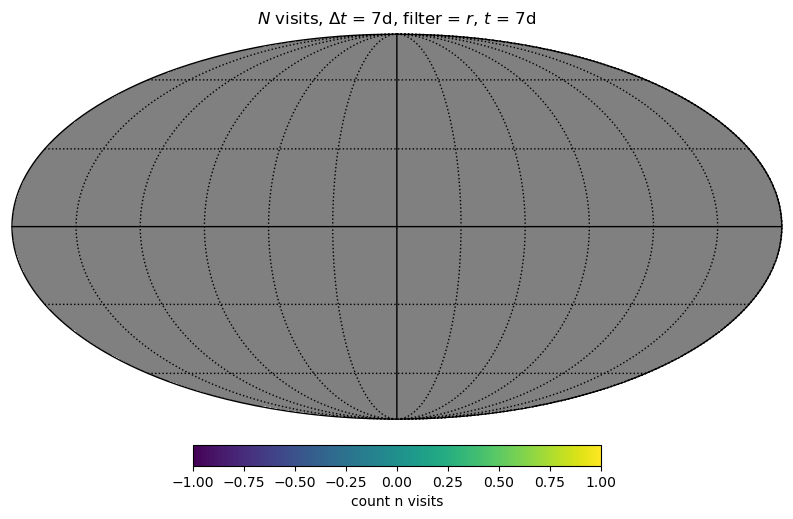

2
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_14_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 14d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_14_and_note_not_like_DD_and_note_not_like_twilight_HEAL.png
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_14_and_note_not_like_DD_and_note_not_like_twil

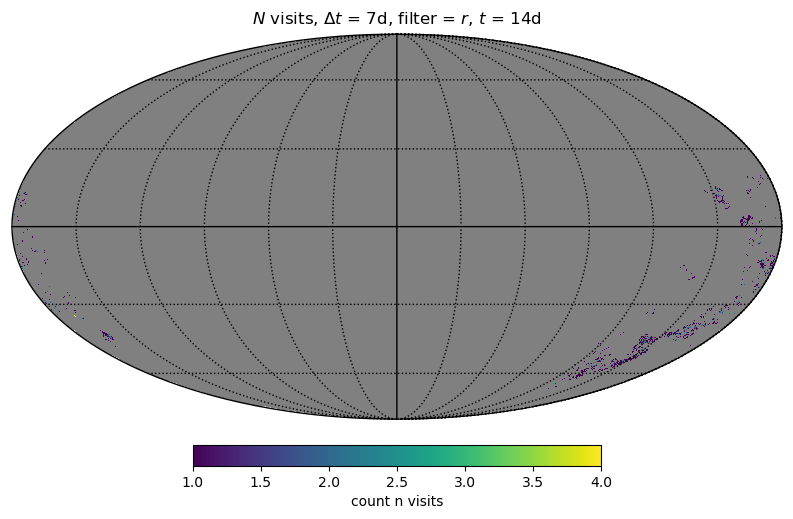

3
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_21_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 21d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_21_and_note_not_like_DD_and_note_not_like_twilight_HEAL.png
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetri

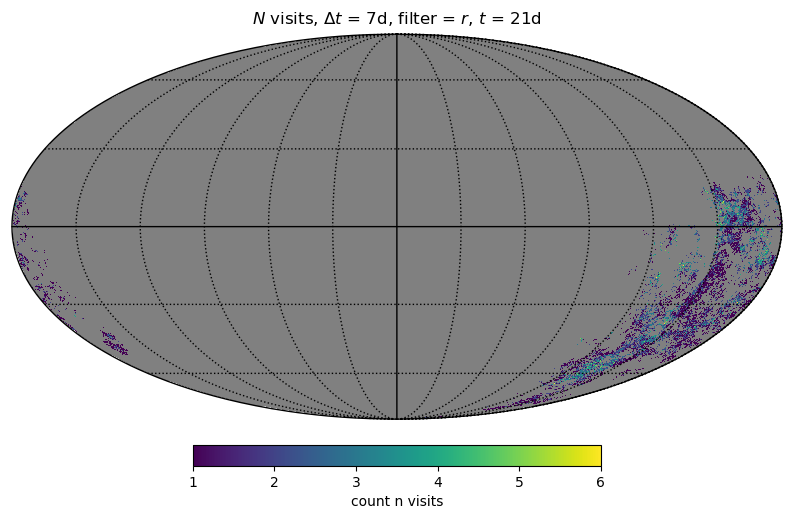

4
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_28_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 28d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_28_and_note_not_like_DD_and_note_not_like_twilight_HEAL.png
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_

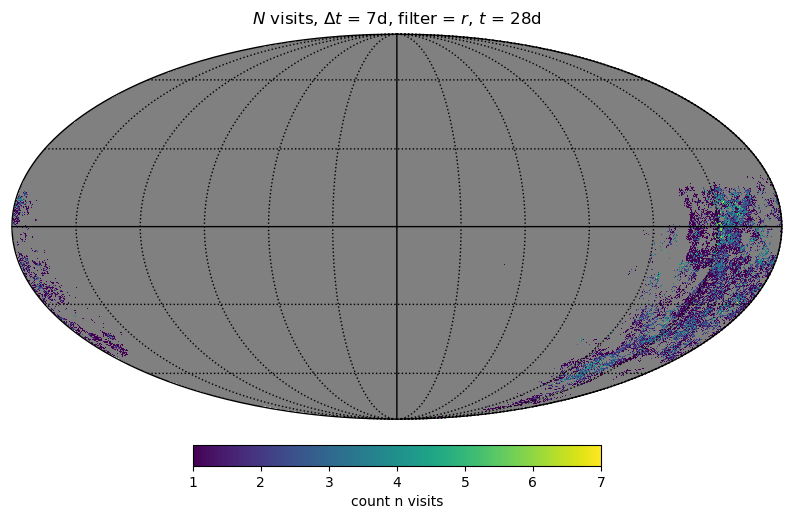

5
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_35_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 35d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_35_and_note_not_like_DD_and_note_not_like_twilight_HEAL.png
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_

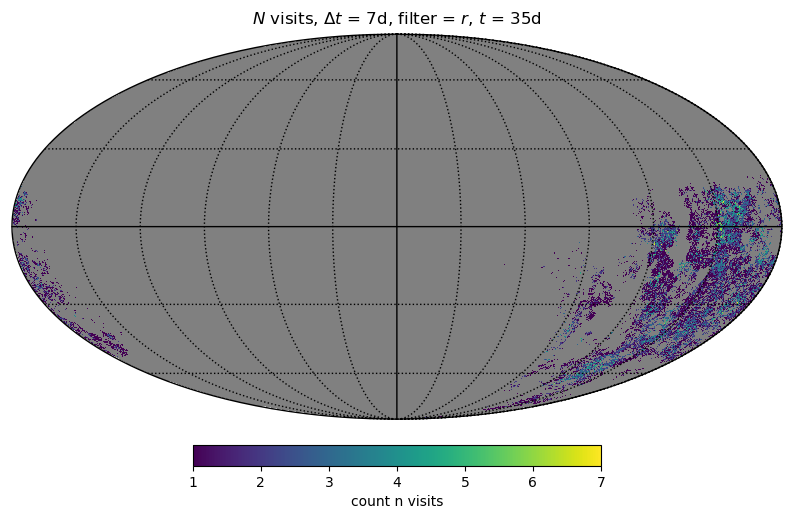

6
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... -- -- --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_42_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 42d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_42_and_note_not_like_DD_and_note_not_like_twil

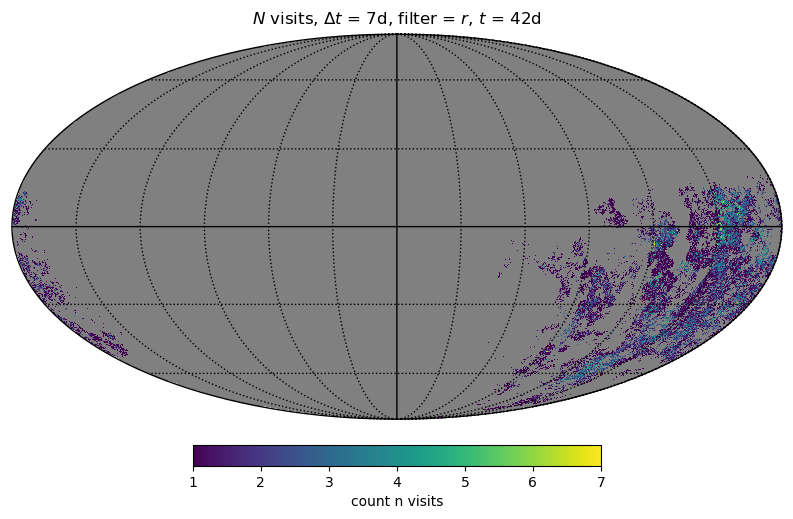

7
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_49_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 49d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMet

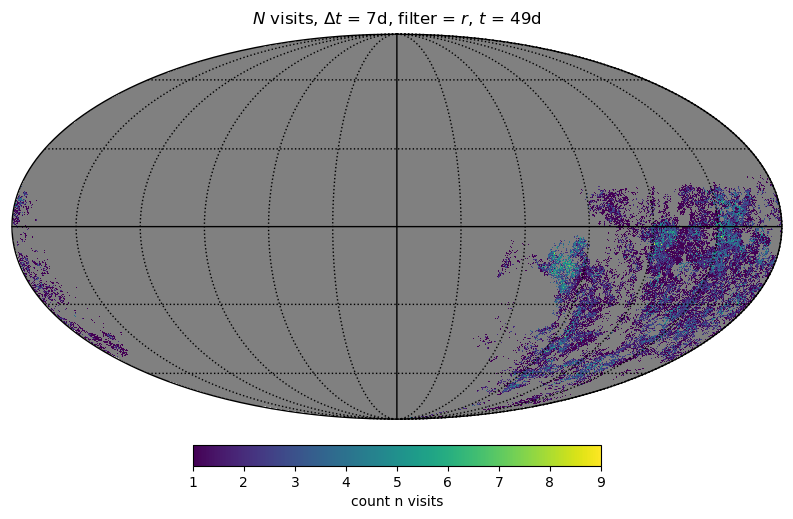

8
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_56_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 56d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/firs

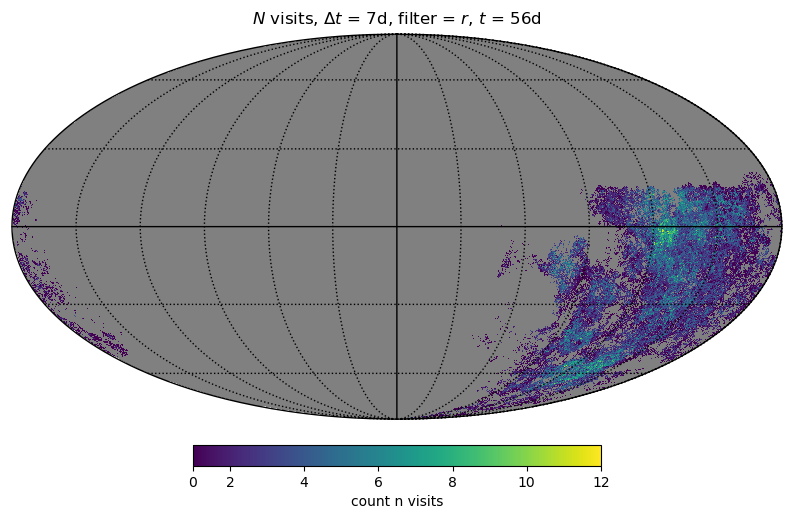

9
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_63_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter = $r$, $t$ = 63d
plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_d

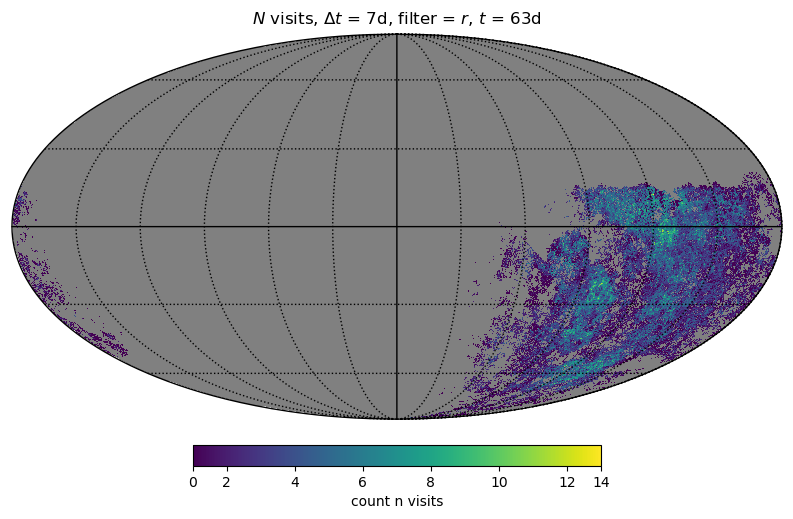

10
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_70_and_note_not_like_DD_and_note_not_like_twilight_HEAL
$N$ visits, $\Delta t$ = 7d, filter 

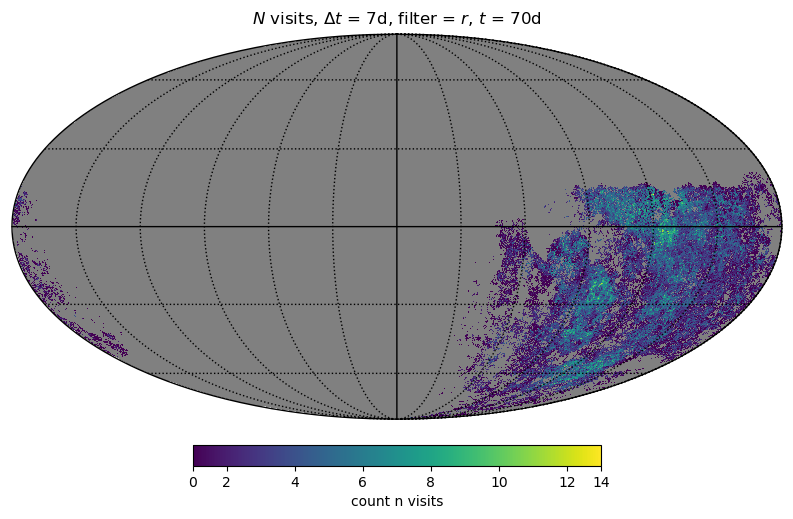

11
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_77_and_note_not_

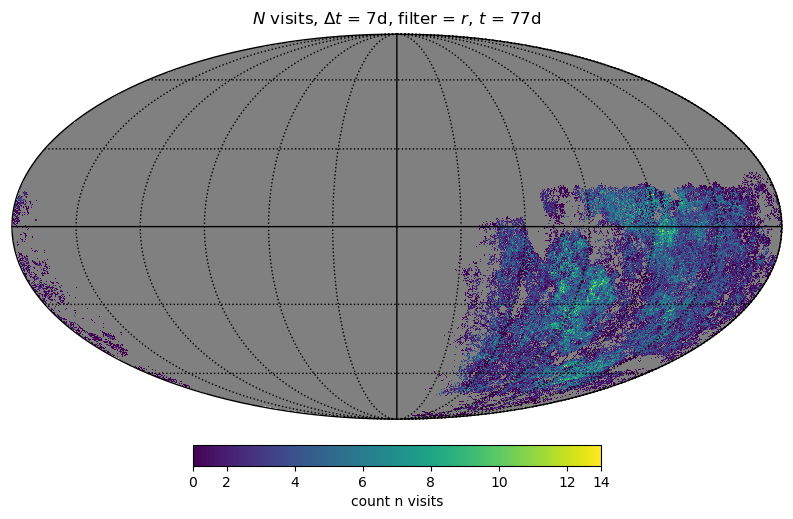

12
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- -- ... 1.0 1.0 --] 786432
first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-

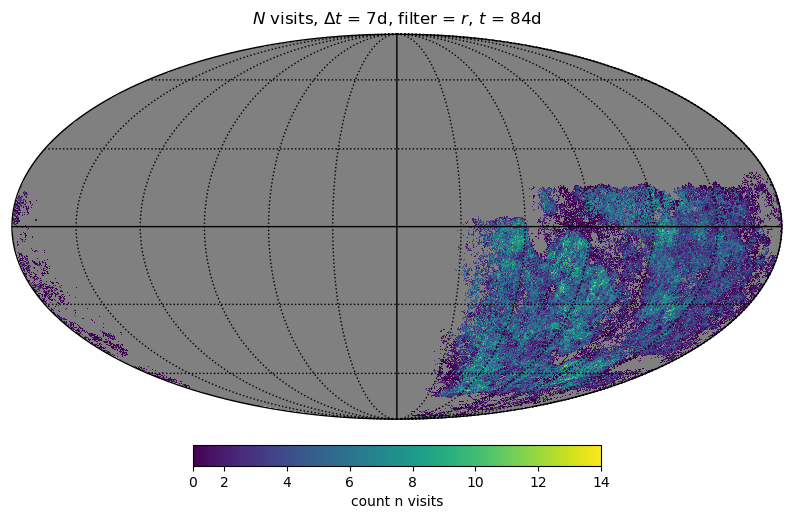

13
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
[-- -- --

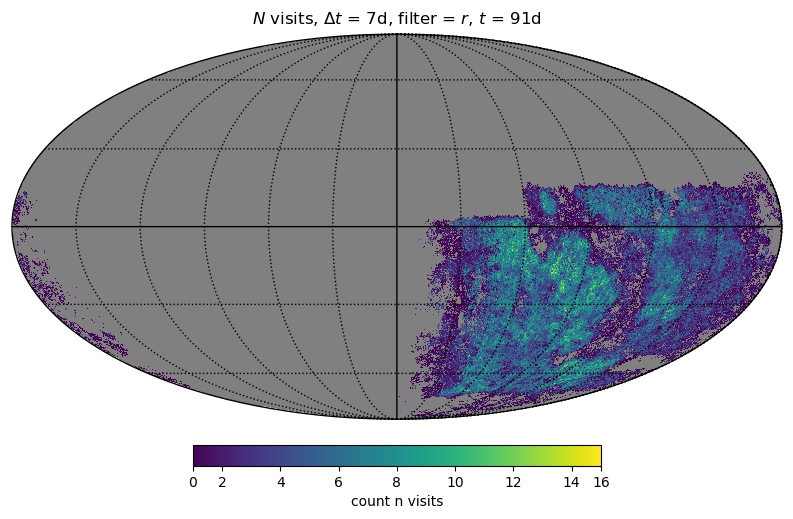

14
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

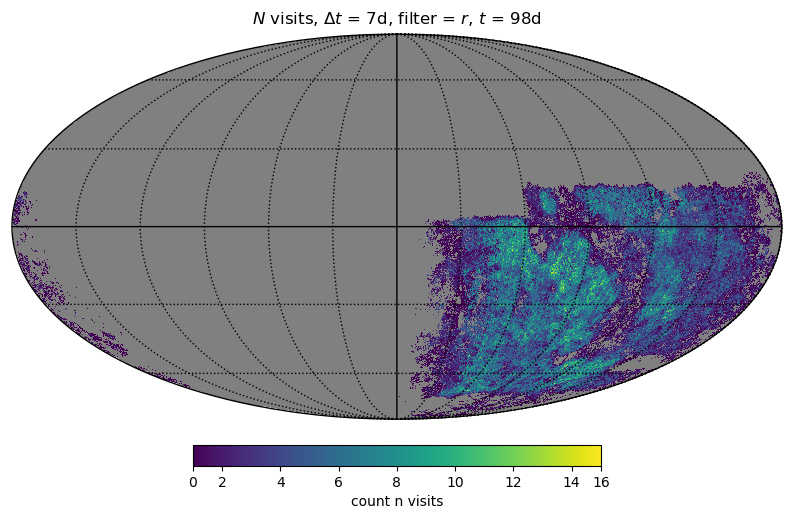

15
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

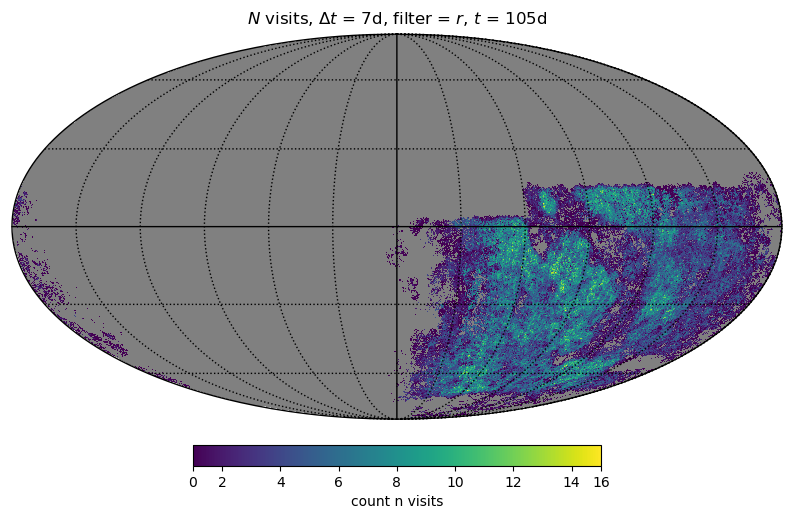

16
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

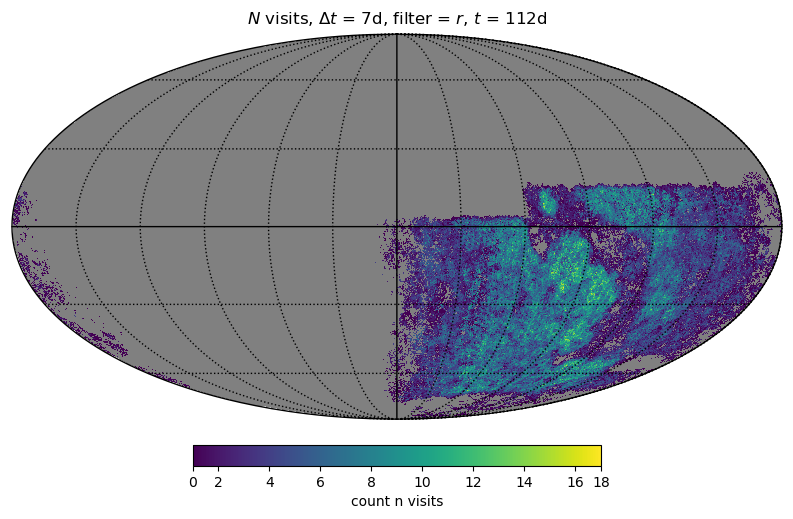

17
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

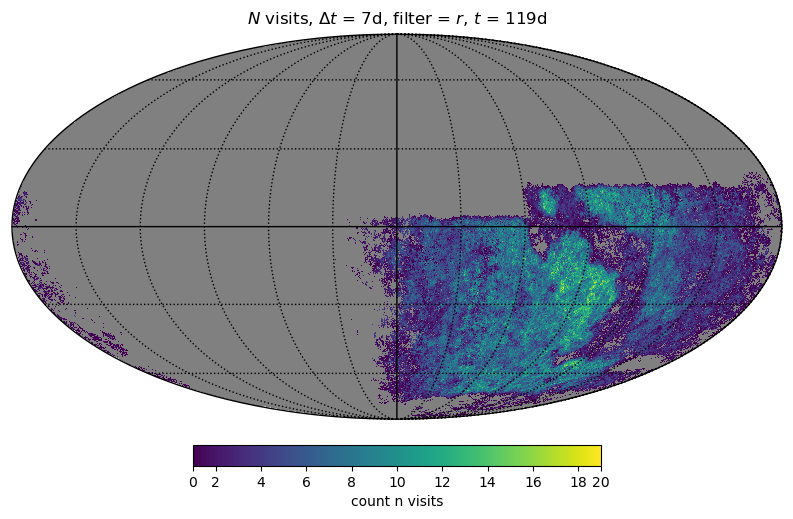

18
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

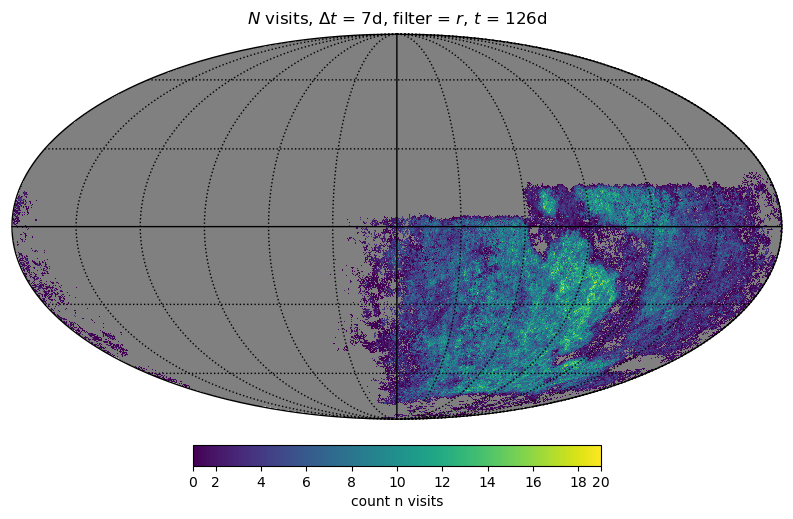

19
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

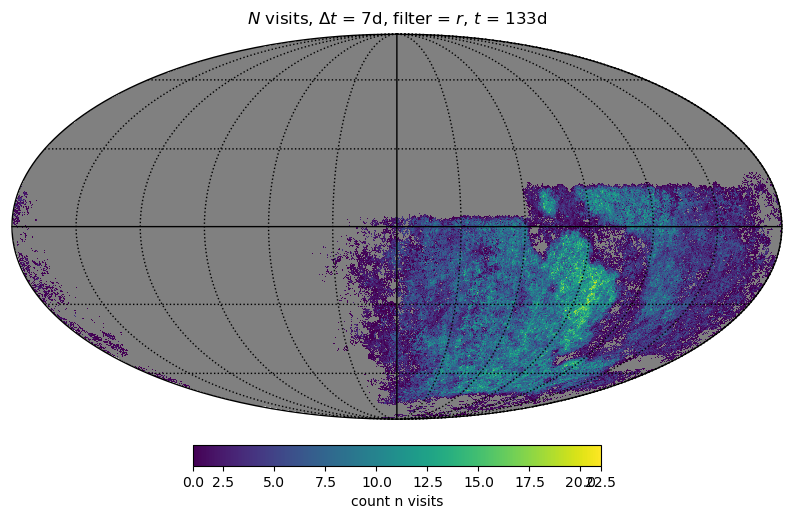

20
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

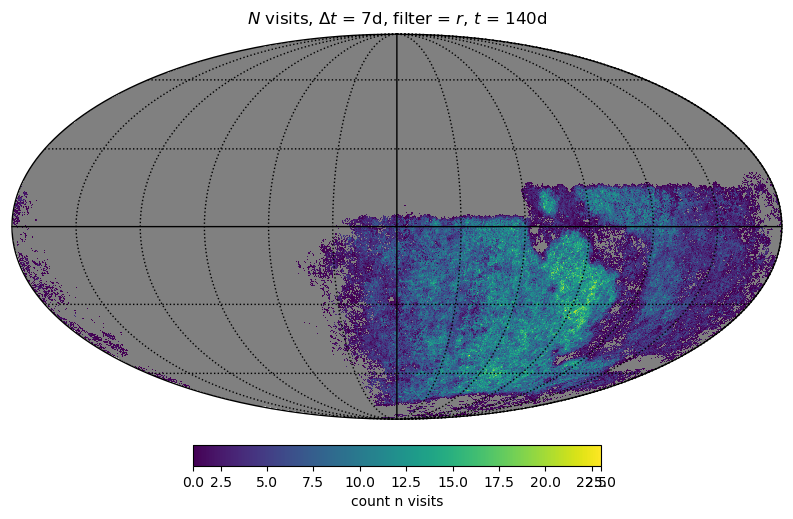

21
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

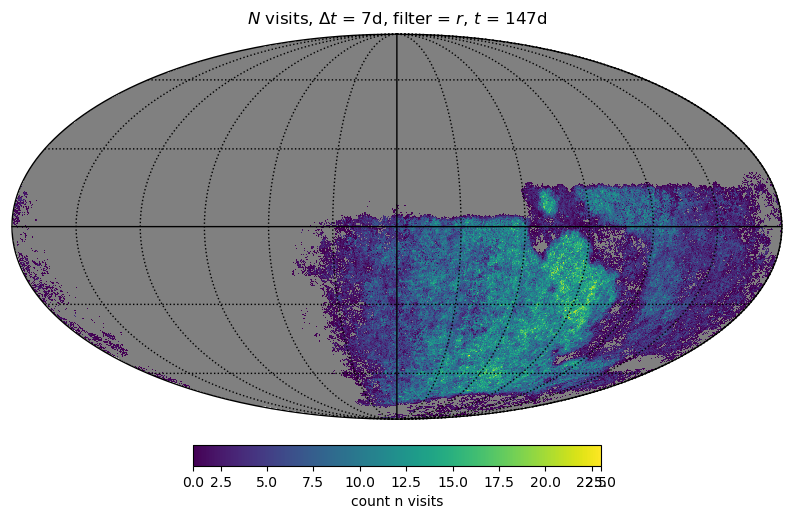

22
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

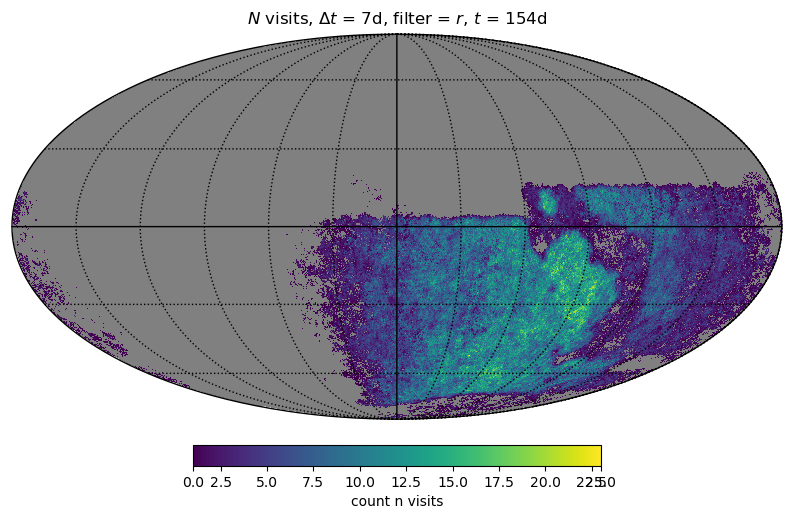

23
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

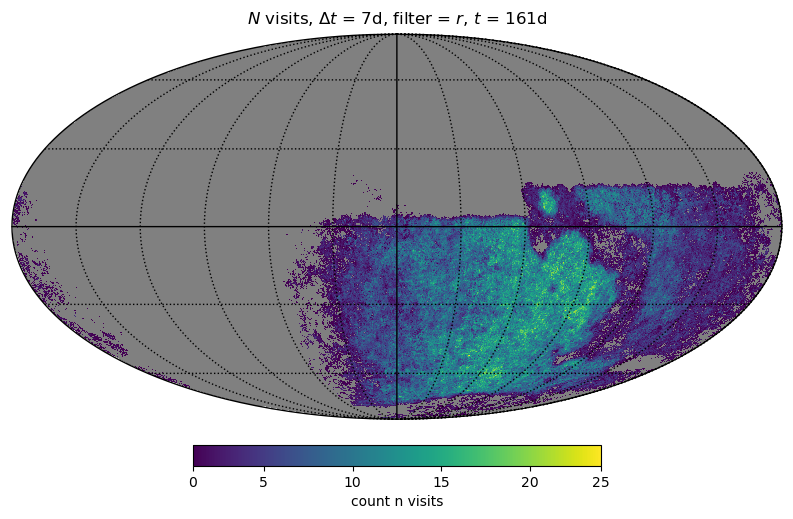

24
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

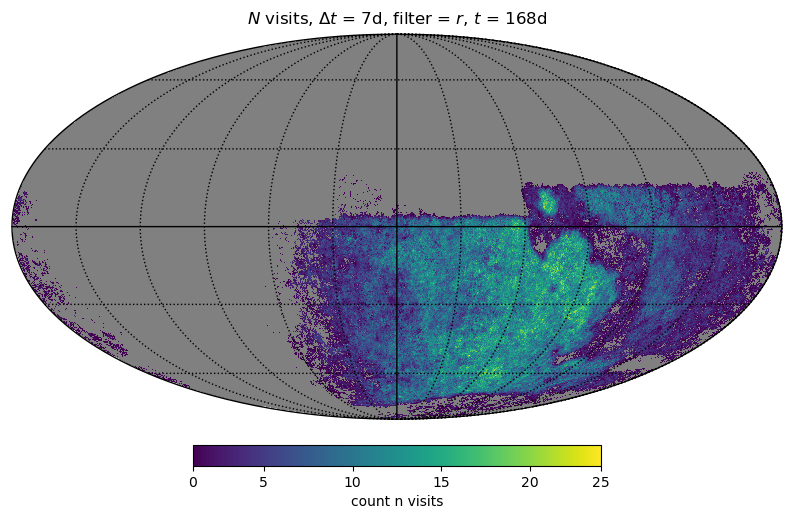

25
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

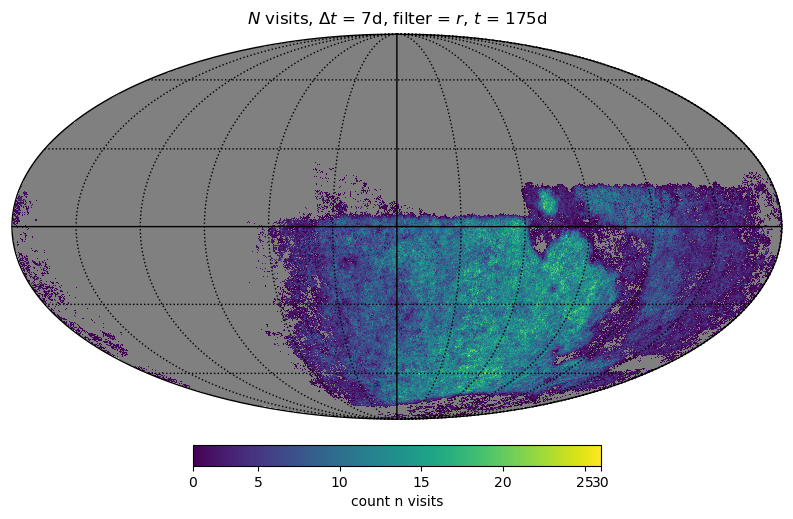

26
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

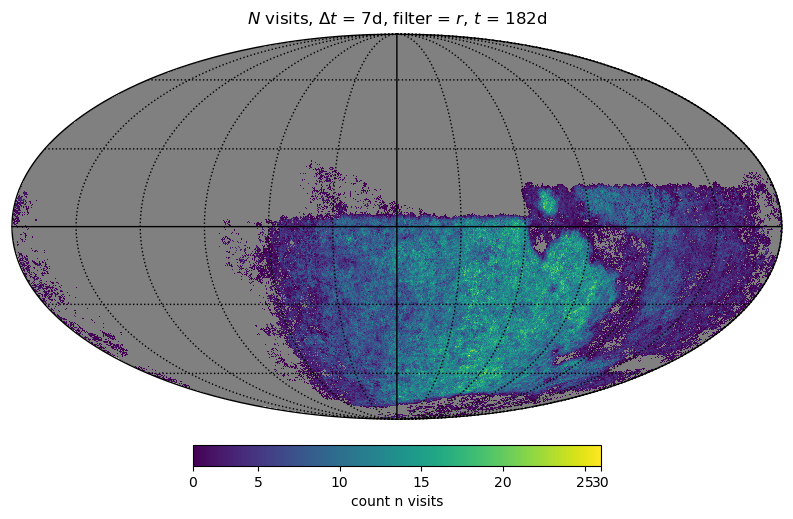

27
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

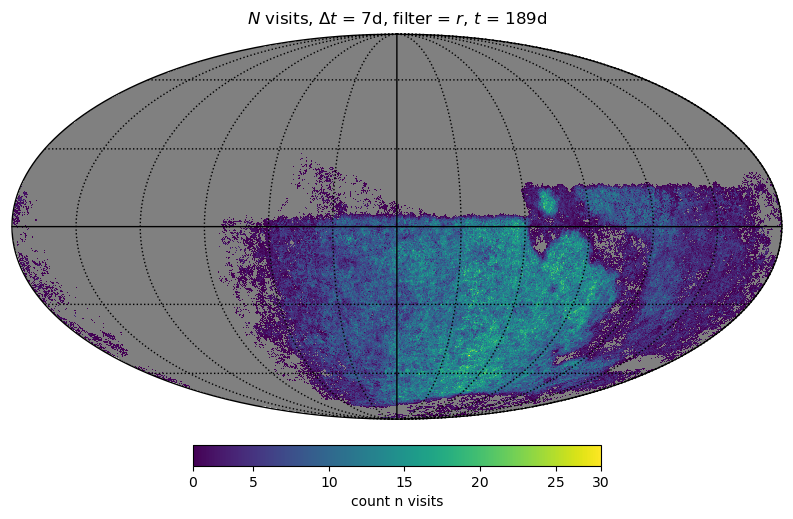

28
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

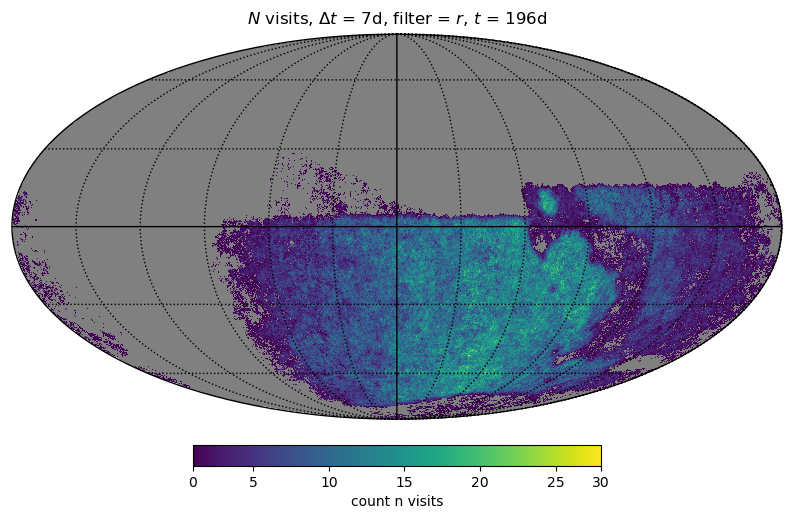

29
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

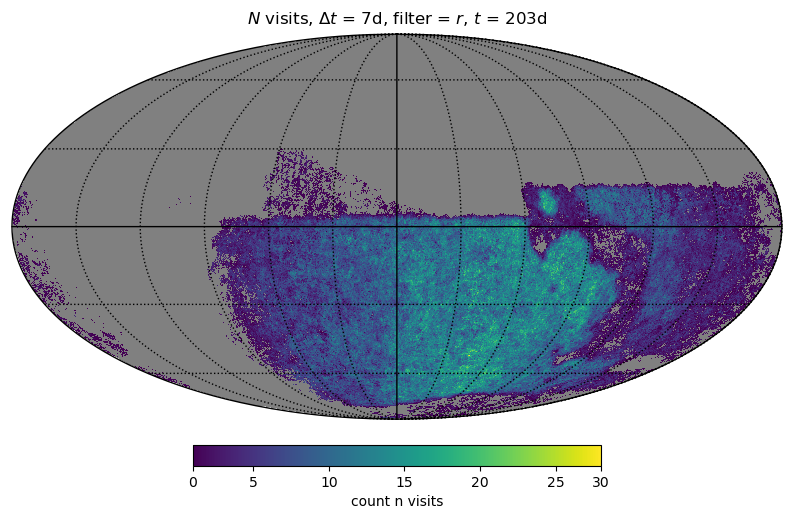

30
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

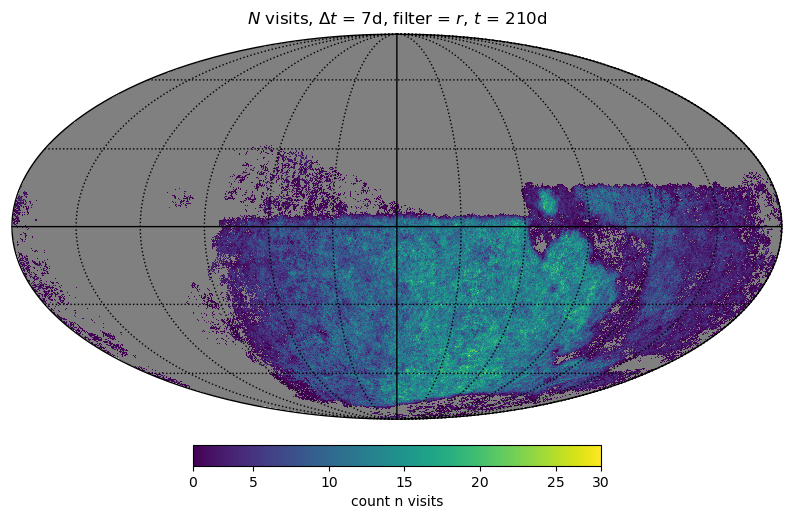

31
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

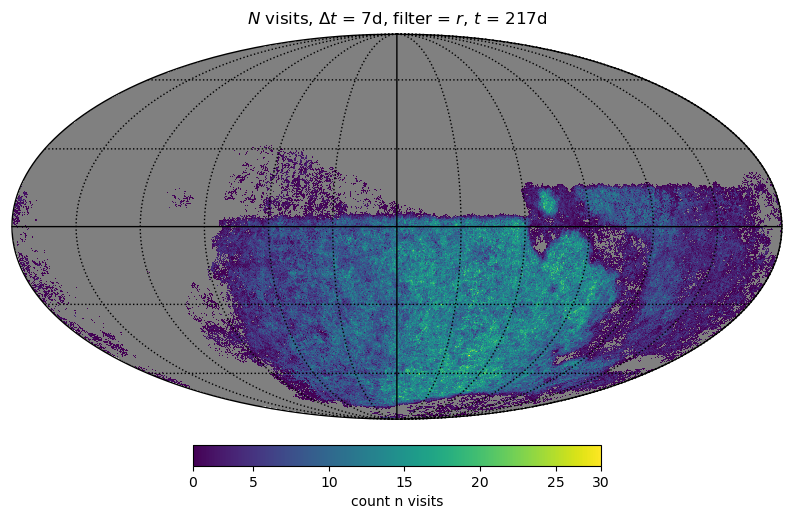

32
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

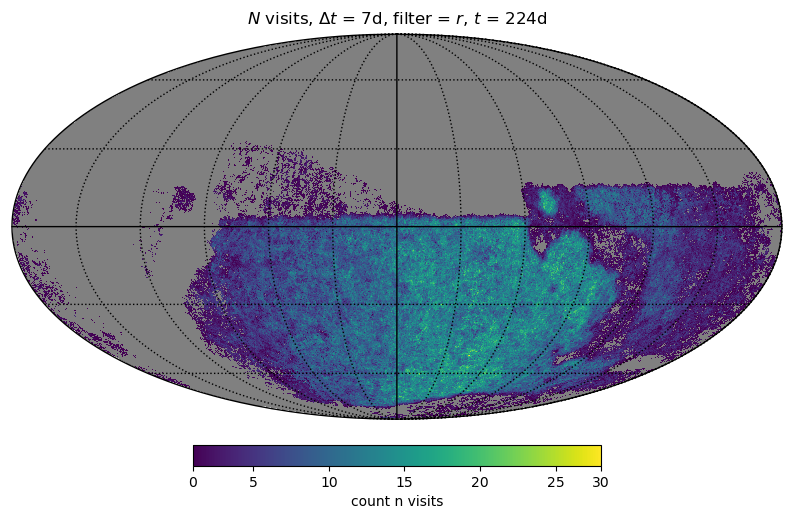

33
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

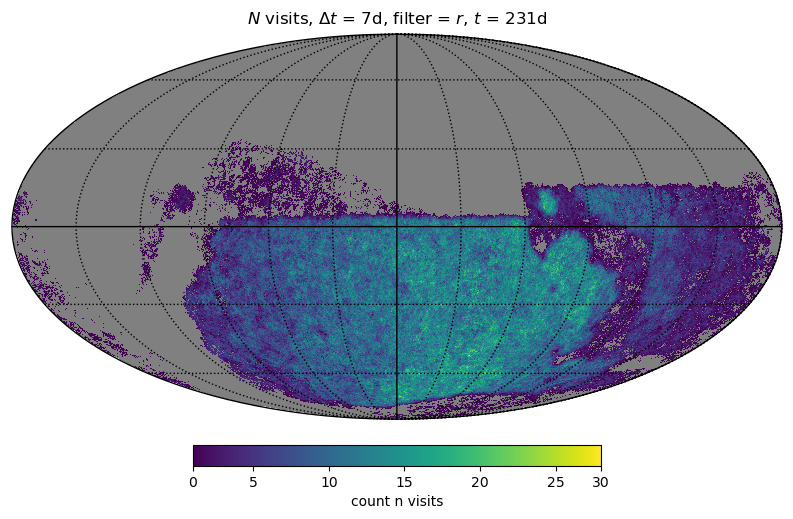

34
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

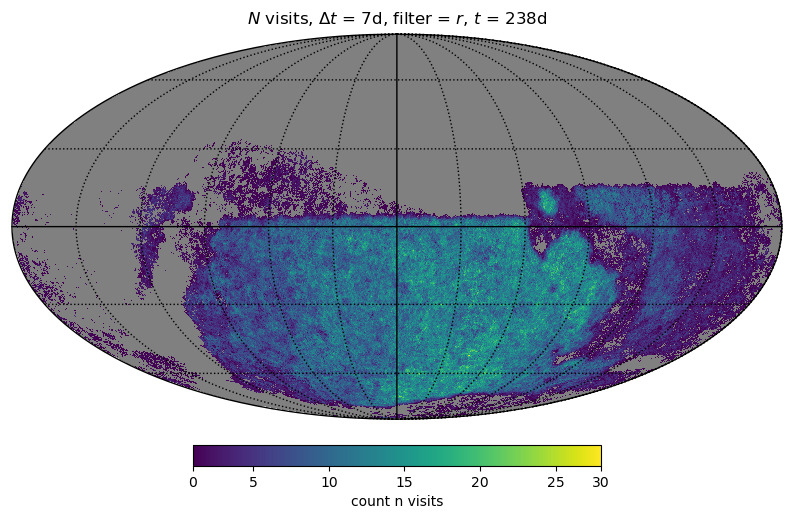

35
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

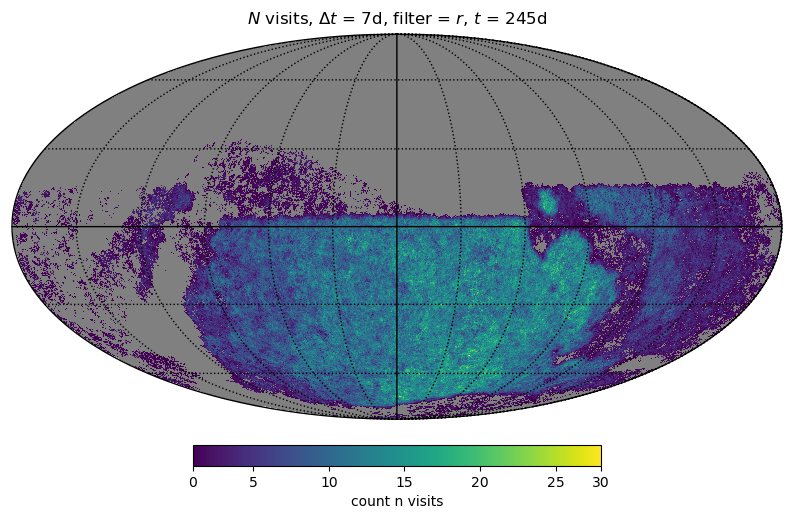

36
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

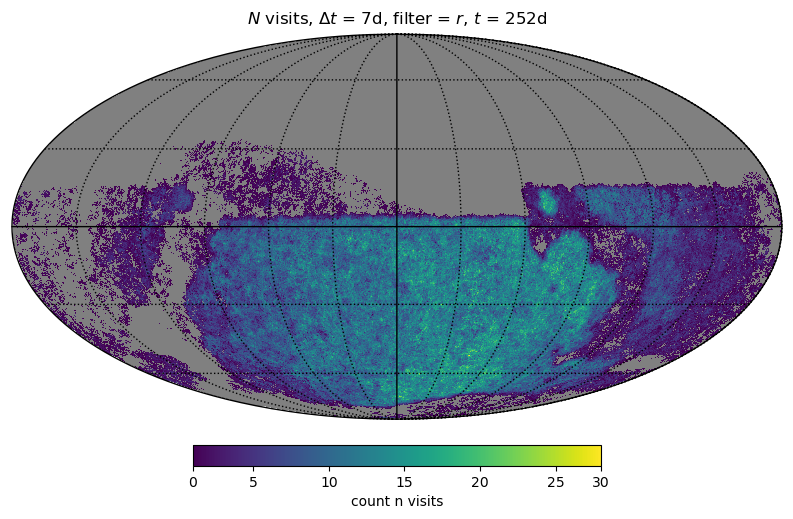

37
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

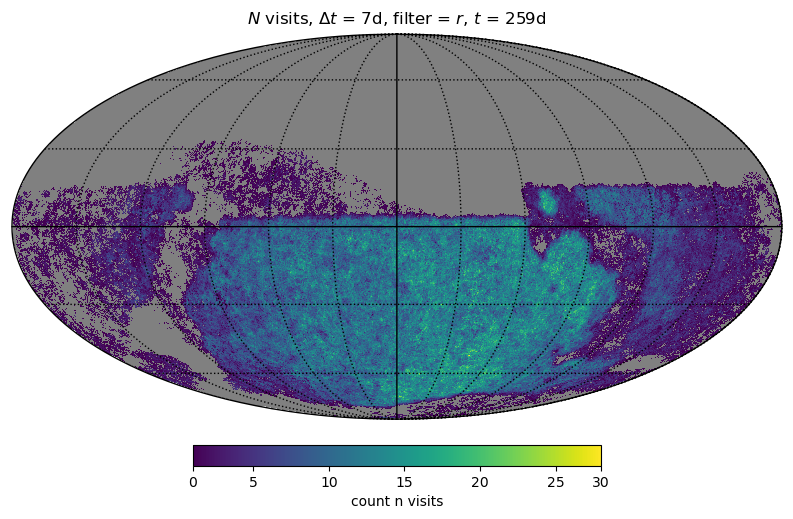

38
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

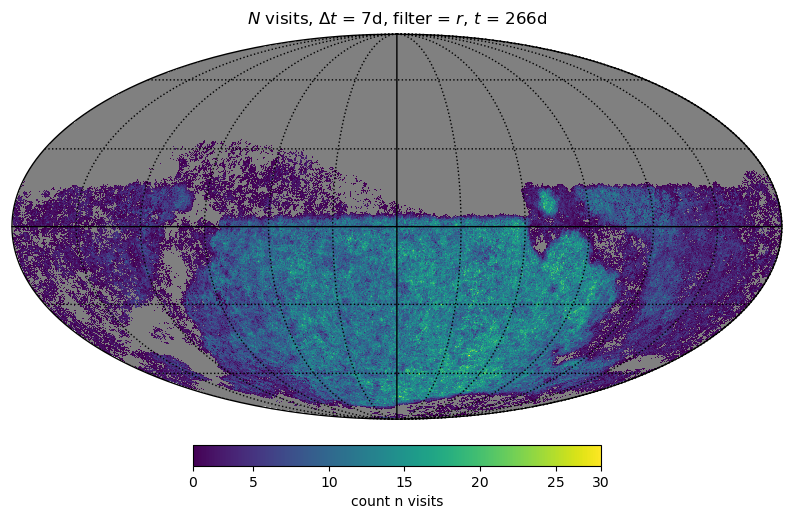

39
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

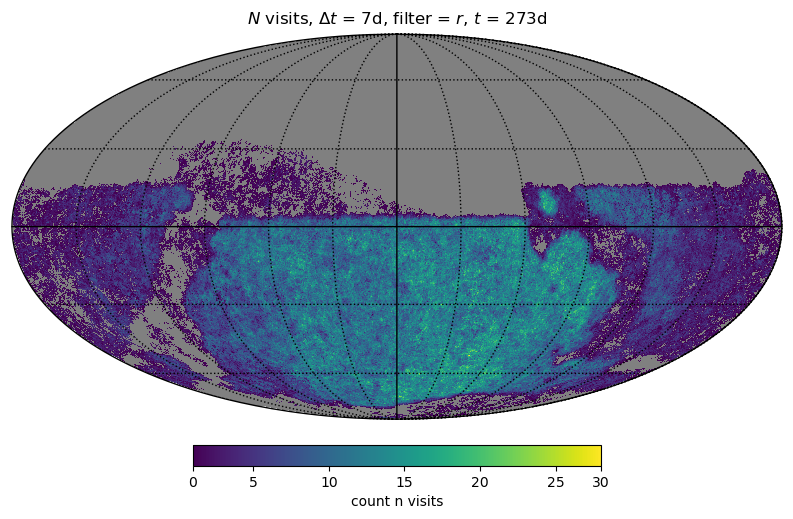

40
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

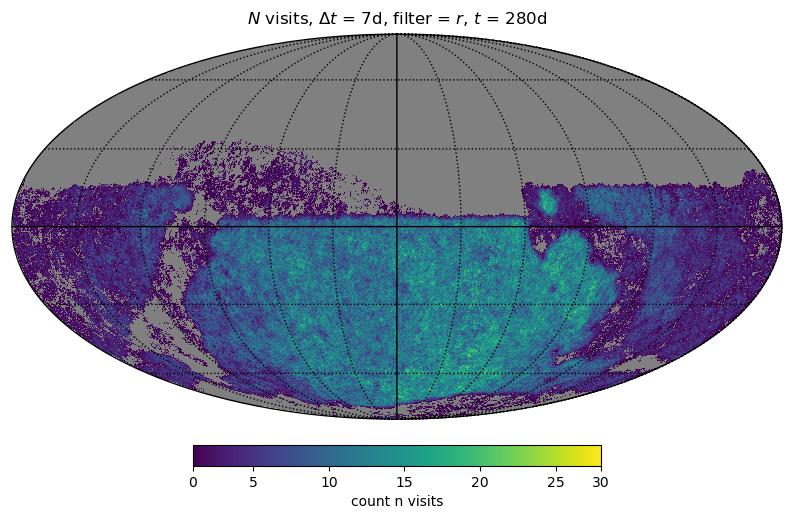

41
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

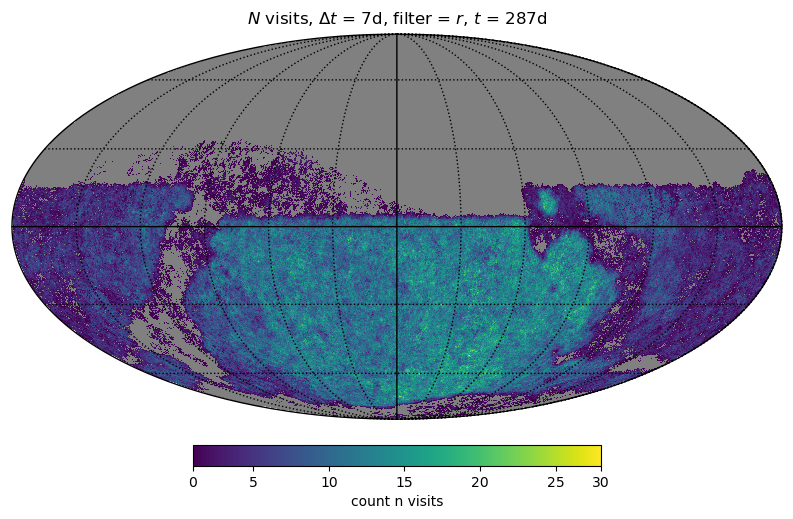

42
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

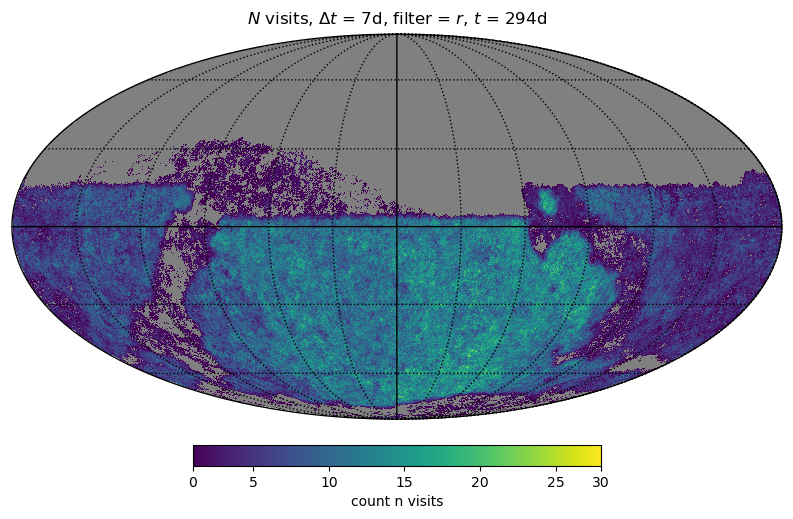

43
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

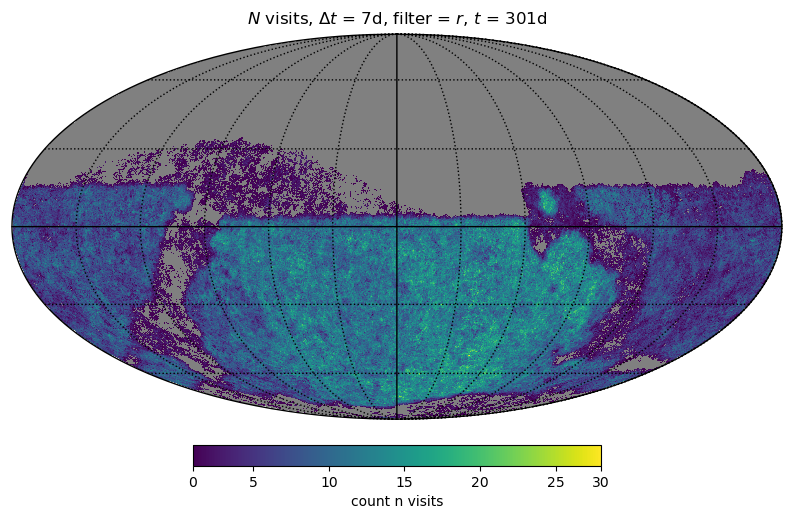

44
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

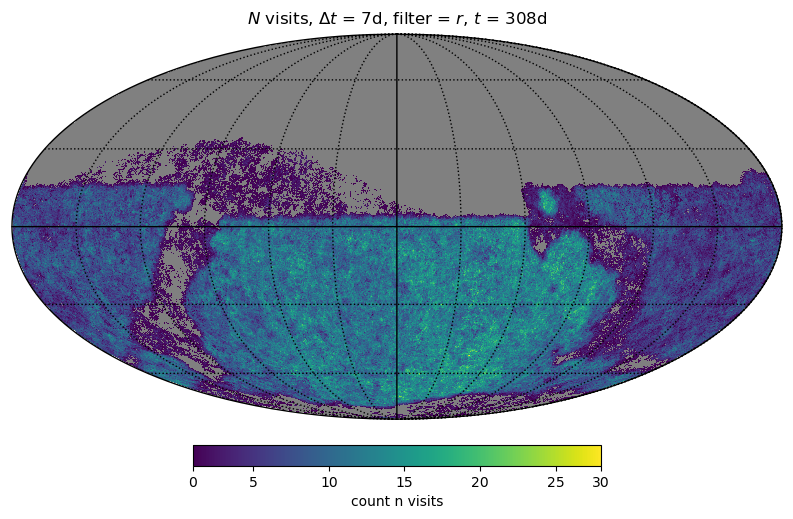

45
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

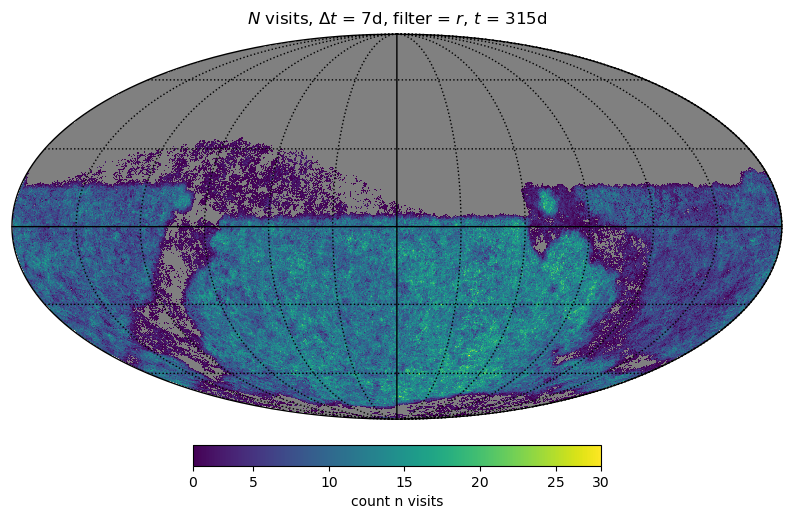

46
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

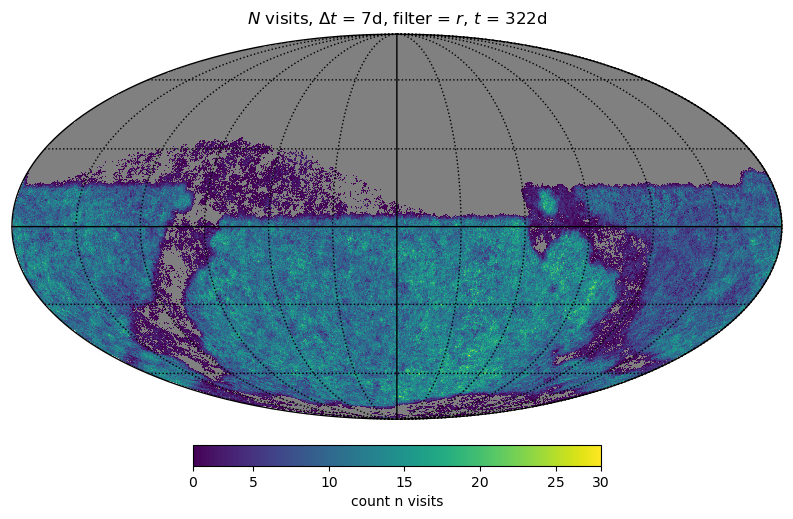

47
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

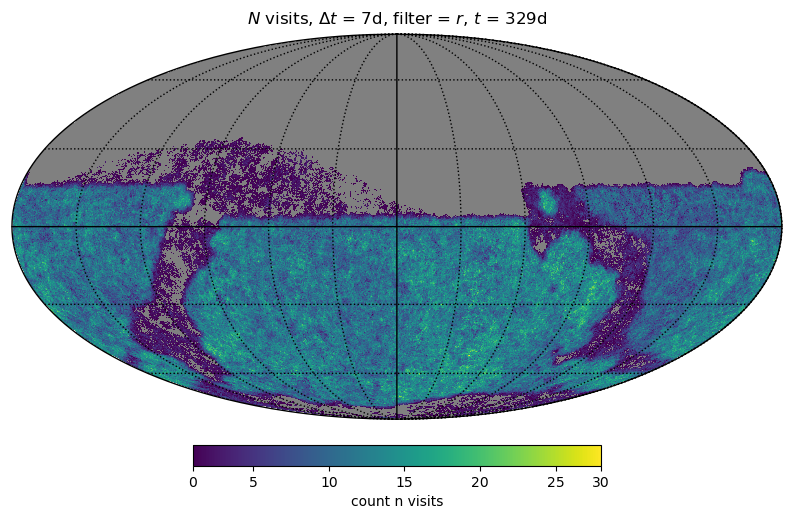

48
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

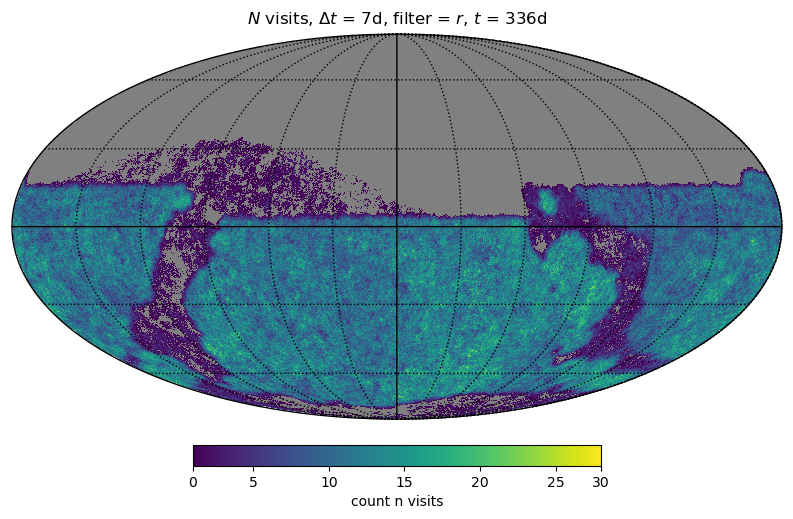

49
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

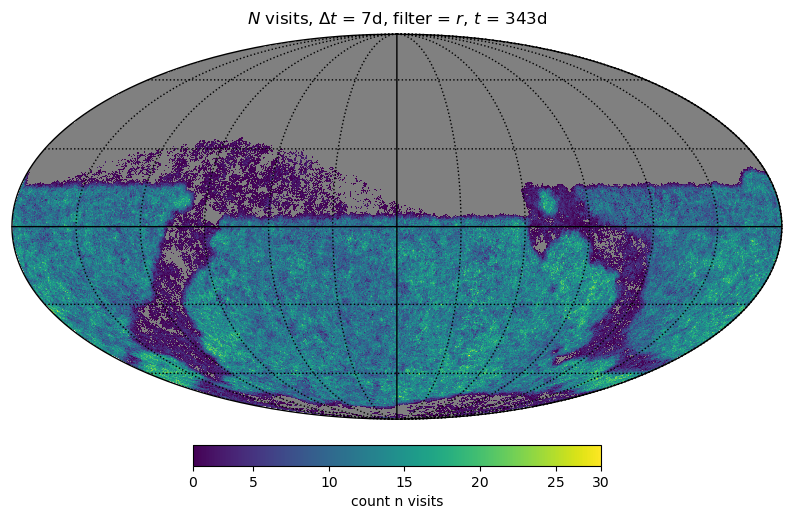

50
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

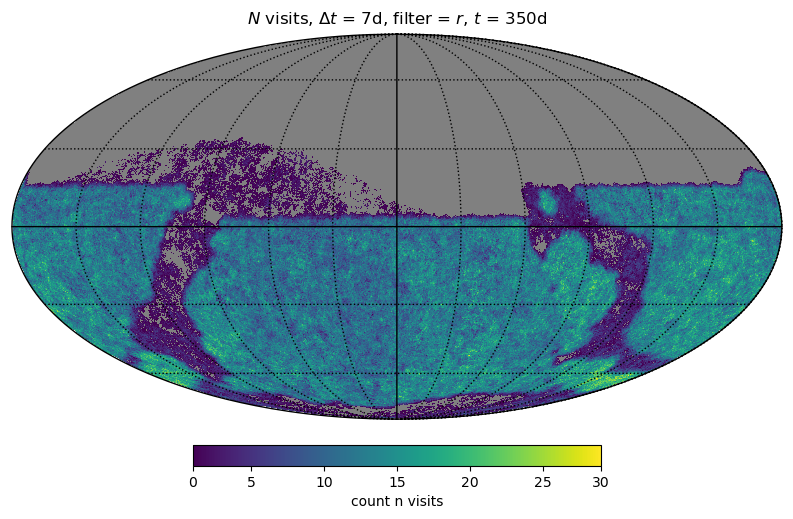

51
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

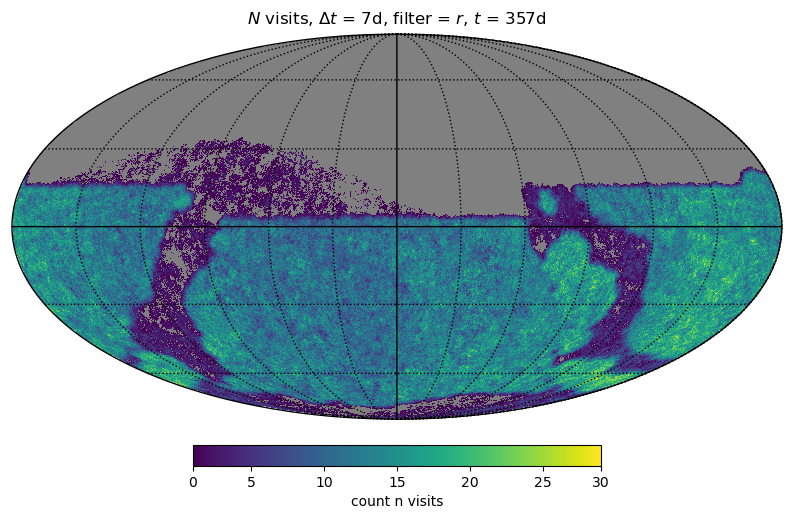

52
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

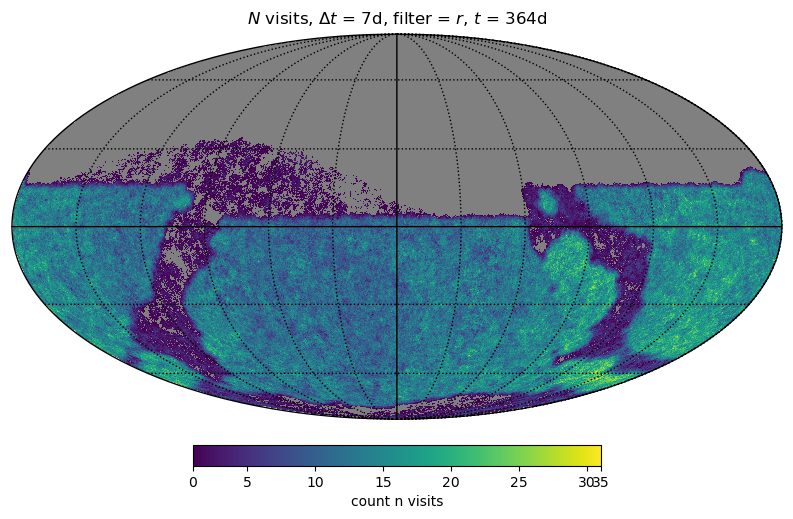

53
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix slicer using NSIDE=256, approximate resolution 13.741946 arcminutes
Healpix s

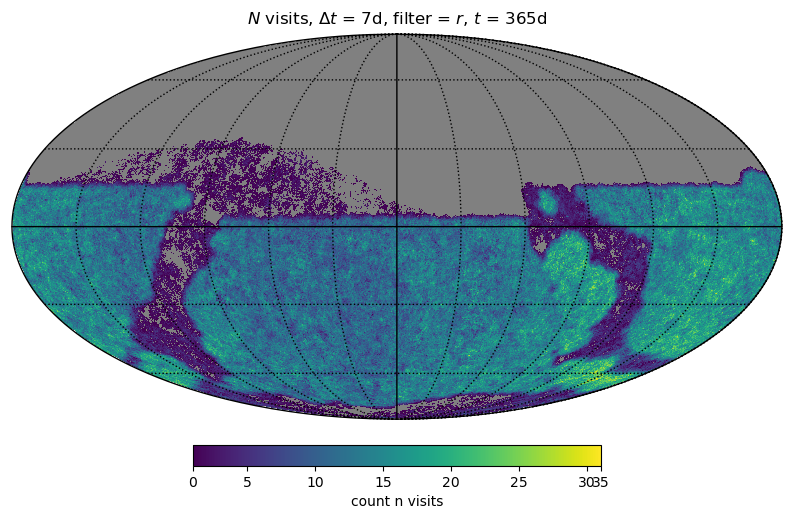

In [20]:
img_files = []

for i in range(len(metric_files)):
    
#     if metric_files[i] not in metric_files_keep:
#         continue

    cum_met_files = metric_files[:i+1]
    print(len(cum_met_files))
    
    # combine all metric files up to this point
    
    # load all these metric files
    metric_bundle = []
    for x in cum_met_files:
        metric_bundle.append(maf.MetricBundle.load(x))

    # retrieve data/mask for all the masked arrays
    # each value in data corresponds to the metric value for some slice point
    data = [mb.metric_values.data for mb in metric_bundle]
    mask = [mb.metric_values.mask for mb in metric_bundle]
    metric_data = np.ma.array(data, mask=mask)

    # find the sum of all constituent metrics
    metric_vals = metric_data.sum(axis=0)

    print(metric_vals,len(metric_vals))

    # replace the masked values with nan
    metric_vals.fill_value = np.nan
    
    metric_fname = metric_bundle[-1].file_root
    print(metric_fname)
    
    title = metric_fname.split("nside-{}_".format(nside))[-1].split("_and_note")[0]
    t_split = title.split("_")
    title = "$N$ visits, $\Delta t$ = {}d, filter = ${}$, $t$ = {}d".format(tscale, t_split[2], t_split[-1])
    print(title)
    
    #plot the skymap
    x = hp.mollview(metric_vals, title=title, 
                    cbar = None)
    hp.graticule()

    # customise the colorbar
    fig = plt.gcf()
    ax = plt.gca()
    image = ax.get_images()[0]
    cbar = fig.colorbar(image, ax=ax, orientation = "horizontal", shrink = 0.5, location = "bottom",
                       pad = 0.05)
    cbar.set_label("count n visits")

    fname = "{}/{}.png".format(savefig_path,metric_fname)
    img_files.append(fname)
    print(fname)
    plt.savefig(fname, facecolor="w", transparent=True, bbox_inches="tight")

    if len(metric_files_keep)<len(metric_files):
        fname = "{}/{}.pdf".format(savefig_path,metric_fname)
        print(fname)
        plt.savefig(fname, facecolor="w", transparent=True, bbox_inches="tight")
    
    plt.show()

In [21]:
### set min/max to end of year 1 values?

In [22]:
# Build GIF
gif_file = '{}/{}.gif'.format(savefig_path,"_".join(metric_fname.split("_lt_*_")).split(".npz")[0])
print(gif_file)
with imageio.get_writer(gif_file, mode='I') as writer:
    for filename in img_files:
        image = imageio.imread(filename)
        writer.append_data(image)

plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_365_and_note_not_like_DD_and_note_not_like_twilight_HEAL.gif


/tmp/ipykernel_363736/1950979358.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


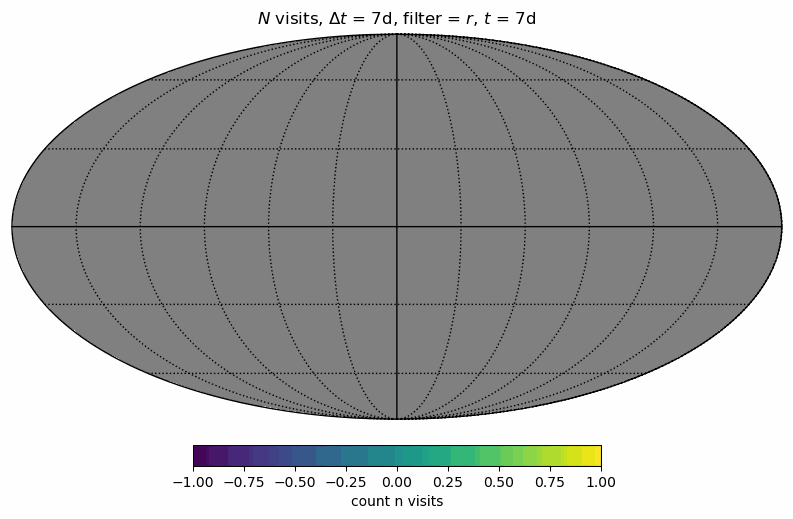

In [23]:
display(Image(data=open(gif_file,'rb').read(), format='gif'))

In [24]:
# Build mp4
mp4_file = '{}/{}.mp4'.format(savefig_path,"_".join(metric_fname.split("_lt_*_")).split(".npz")[0])
print(mp4_file)
with imageio.get_writer(mp4_file, mode='I') as writer:
    for filename in img_files:
        image = imageio.imread(filename)
        writer.append_data(image)

plot_template_coverage_figs/first_year_baseline_v3_3_10yrs_db_n_visits_4_noDD_noTwi_nside_256_t-7d_doAllTemplateMetrics_reduceCount/first_year_baseline_v3_3_10yrs_db_noDD_noTwi_tscale-7_nside-256_doAllTemplateMetrics_reduceCount_r_and_night_lt_365_and_note_not_like_DD_and_note_not_like_twilight_HEAL.mp4


/tmp/ipykernel_363736/3582852256.py:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (793, 519) to (800, 528) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[swscaler @ 0x567bc00] Warning: data is not aligned! This can lead to a speed loss
